# Facebook Ego Network Analysis

**Dataset:** [Facebook Combined Ego Networks](https://snap.stanford.edu/data/ego-Facebook.html)

---

## Overview

This notebook performs an exploratory data analysis on the Facebook ego network dataset from Stanford SNAP. The analysis includes:

1. **Centrality Analysis:** Computing and identifying central nodes using multiple centrality measures
2. **Network Visualization:** Creating an interactive visualization with multiple visual encodings

## Dataset Description

The dataset consists of 'circles' (or 'friends lists') from Facebook. It includes node features, circles, and ego networks combined into a single network. The network is anonymized.

- **Nodes:** Facebook users
- **Edges:** Friendships between users
- **Type:** Undirected, unweighted social network

In [1]:
import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.offline import iplot, init_notebook_mode
import warnings
warnings.filterwarnings('ignore')

# Initialize plotly for notebook
init_notebook_mode(connected=True)

print("✓ Libraries imported successfully!")

✓ Libraries imported successfully!


## Part 1: Data Loading and Exploration

First, we'll load the network and examine its basic properties.

In [2]:
# Load the Facebook combined network
# Make sure 'facebook_combined.txt' is in the same directory as this notebook
G = nx.read_edgelist('facebook_combined.txt', nodetype=int)

print("="*80)
print("DATASET LOADED")
print("="*80)
print(f"\nBasic Network Statistics:")
print(f"  • Number of nodes: {G.number_of_nodes():,}")
print(f"  • Number of edges: {G.number_of_edges():,}")
print(f"  • Network density: {nx.density(G):.6f}")
print(f"  • Is connected: {nx.is_connected(G)}")
print(f"  • Number of connected components: {nx.number_connected_components(G)}")

DATASET LOADED

Basic Network Statistics:
  • Number of nodes: 4,039
  • Number of edges: 88,234
  • Network density: 0.010820
  • Is connected: True
  • Number of connected components: 1


In [3]:
# Get the largest connected component for analysis
if not nx.is_connected(G):
    largest_cc = max(nx.connected_components(G), key=len)
    G = G.subgraph(largest_cc).copy()
    print(f"\n→ Using largest connected component with {G.number_of_nodes()} nodes")
else:
    print("\n→ Network is fully connected!")


→ Network is fully connected!


## Part 2: Centrality Measures

We'll compute four different centrality measures to identify important nodes from different perspectives:

### Centrality Measures Explained:

1. **Degree Centrality:** Measures how many connections a node has
   - High degree = "Popular" nodes with many friends
2. **Betweenness Centrality:** Measures how often a node lies on shortest paths between other nodes
   - High betweenness = "Bridge" nodes that connect different groups
3. **Closeness Centrality:** Measures the average distance from a node to all other nodes
   - High closeness = Can reach everyone quickly
4. **Eigenvector Centrality:** Measures influence based on the importance of neighbors
   - High eigenvector = Connected to other important nodes

In [4]:
print("\n1. Computing Degree Centrality...")
degree_centrality = nx.degree_centrality(G)
print("   ✓ Done!")


1. Computing Degree Centrality...
   ✓ Done!


In [5]:
print("2. Computing Betweenness Centrality...")
betweenness_centrality = nx.betweenness_centrality(G)
print("   ✓ Done!")

2. Computing Betweenness Centrality...
   ✓ Done!


In [6]:
print("3. Computing Closeness Centrality...")
closeness_centrality = nx.closeness_centrality(G)
print("   ✓ Done!")

3. Computing Closeness Centrality...
   ✓ Done!


In [7]:
print("4. Computing Eigenvector Centrality...")
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)
print("   ✓ Done!")

4. Computing Eigenvector Centrality...
   ✓ Done!


In [8]:
# Create a DataFrame with all centrality measures
centrality_df = pd.DataFrame({
    'Node': list(G.nodes()),
    'Degree': [degree_centrality[node] for node in G.nodes()],
    'Betweenness': [betweenness_centrality[node] for node in G.nodes()],
    'Closeness': [closeness_centrality[node] for node in G.nodes()],
    'Eigenvector': [eigenvector_centrality[node] for node in G.nodes()]
})

print("✓ Centrality DataFrame created!")
print(f"\nDataFrame shape: {centrality_df.shape}")
centrality_df.head(10)

✓ Centrality DataFrame created!

DataFrame shape: (4039, 5)


,Node,Degree,Betweenness,Closeness,Eigenvector
0,0,0.085934,1.463059e-01,0.353343,3.391796e-05
1,1,0.004210,2.783274e-06,0.261376,6.045346e-07
2,2,0.002476,7.595021e-08,0.261258,2.233461e-07
3,3,0.004210,1.685066e-06,0.261376,6.635648e-07
4,4,0.002476,1.840332e-07,0.261258,2.236416e-07
5,5,0.003219,2.205964e-06,0.261308,1.183322e-06
6,6,0.001486,2.453776e-08,0.261190,2.170904e-07
7,7,0.004953,1.702985e-04,0.274769,2.568510e-05
8,8,0.001981,2.760498e-07,0.261224,2.197375e-07
9,9,0.014116,1.645424e-05,0.262055,2.214117e-06


In [9]:
print("="*80)
print("TOP 10 MOST CENTRAL NODES")
print("="*80)

print("\n📊 By Degree Centrality (most connections):")
print(centrality_df.nlargest(10, 'Degree')[['Node', 'Degree']])

print("\n📊 By Betweenness Centrality (best bridges between groups):")
print(centrality_df.nlargest(10, 'Betweenness')[['Node', 'Betweenness']])

print("\n📊 By Closeness Centrality (closest to everyone):")
print(centrality_df.nlargest(10, 'Closeness')[['Node', 'Closeness']])

print("\n📊 By Eigenvector Centrality (most influential connections):")
print(centrality_df.nlargest(10, 'Eigenvector')[['Node', 'Eigenvector']])

TOP 10 MOST CENTRAL NODES

📊 By Degree Centrality (most connections):
      Node    Degree
107    107  0.258791
351   1684  0.196137
352   1912  0.186974
1821  3437  0.135463
0        0  0.085934
1490  2543  0.072808
2154  2347  0.072065
1373  1888  0.062902
1285  1800  0.060674
1149  1663  0.058197

📊 By Betweenness Centrality (best bridges between groups):
      Node  Betweenness
107    107     0.480518
351   1684     0.337797
1821  3437     0.236115
352   1912     0.229295
571   1085     0.149015
0        0     0.146306
1843   698     0.115330
1710   567     0.096310
58      58     0.084360
350    428     0.064309

📊 By Closeness Centrality (closest to everyone):
     Node  Closeness
107   107   0.459699
58     58   0.397402
350   428   0.394837
371   563   0.393913
351  1684   0.393606
171   171   0.370493
348   348   0.369916
366   483   0.369848
349   414   0.369543
362   376   0.366558

📊 By Eigenvector Centrality (most influential connections):
      Node  Eigenvector
352   191

In [10]:
print("\n" + "="*80)
print("CENTRALITY STATISTICS SUMMARY")
print("="*80)
centrality_df[['Degree', 'Betweenness', 'Closeness', 'Eigenvector']].describe()


CENTRALITY STATISTICS SUMMARY


,Degree,Betweenness,Closeness,Eigenvector
count,4039.000000,4.039000e+03,4039.000000,4.039000e+03
mean,0.010820,6.669574e-04,0.276168,3.864341e-03
std,0.012982,1.164634e-02,0.036124,1.525485e-02
min,0.000248,0.000000e+00,0.178255,6.385265e-14
25%,0.002724,3.997507e-07,0.260348,5.388575e-08
50%,0.006191,2.918300e-06,0.282457,8.885652e-07
75%,0.014116,1.515292e-05,0.315001,3.266349e-05
max,0.258791,4.805181e-01,0.459699,9.540696e-02


## Part 3: Network Visualization

Now we'll create an interactive visualization of the network with multiple visual encodings.

### Visual Encodings:
- **Node Size:** Represents Degree Centrality (bigger = more connections)
- **Node Color:** Represents Betweenness Centrality (brighter = better bridge)
- **Tooltips:** Show detailed information when hovering over nodes
- **Layout:** Spring (force-directed) layout - nodes repel, edges attract

In [11]:
print("="*80)
print("PREPARING NETWORK VISUALIZATION")
print("="*80)

# For visualization, we'll sample the network if it's too large
MAX_NODES_VISUALIZE = 1000
if G.number_of_nodes() > MAX_NODES_VISUALIZE:
    print(f"\nNetwork has {G.number_of_nodes()} nodes.")
    print(f"Sampling top {MAX_NODES_VISUALIZE} nodes by degree centrality for visualization...")
    top_nodes = centrality_df.nlargest(MAX_NODES_VISUALIZE, 'Degree')['Node'].tolist()
    G_vis = G.subgraph(top_nodes).copy()
    print(f"✓ Visualization graph: {G_vis.number_of_nodes()} nodes, {G_vis.number_of_edges()} edges")
else:
    G_vis = G
    print(f"✓ Visualizing full network: {G_vis.number_of_nodes()} nodes")

PREPARING NETWORK VISUALIZATION

Network has 4039 nodes.
Sampling top 1000 nodes by degree centrality for visualization...
✓ Visualization graph: 1000 nodes, 46009 edges


In [12]:
print("\nComputing spring layout (this may take a moment)...")
pos = nx.spring_layout(G_vis, k=0.5, iterations=50, seed=42)
print("✓ Layout computed!")


Computing spring layout (this may take a moment)...
✓ Layout computed!


In [13]:
# Prepare node attributes
node_ids = list(G_vis.nodes())
node_degrees = [degree_centrality[node] for node in node_ids]
node_betweenness = [betweenness_centrality[node] for node in node_ids]
node_actual_degree = [G_vis.degree(node) for node in node_ids]

# Visual Encoding 1: Node SIZE = Degree Centrality (scaled)
node_sizes = [max(5, deg * 500) for deg in node_degrees]

# Visual Encoding 2: Node COLOR = Betweenness Centrality
node_colors = node_betweenness

print(f"✓ Prepared attributes for {len(node_ids)} nodes")

✓ Prepared attributes for 1000 nodes


In [14]:
# Create edge trace for visualization
edge_x = []
edge_y = []
for edge in G_vis.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines',
    name='Connections'
)

print(f"✓ Edge trace created with {G_vis.number_of_edges()} edges")

✓ Edge trace created with 46009 edges


In [15]:
# Get node positions
node_x = [pos[node][0] for node in node_ids]
node_y = [pos[node][1] for node in node_ids]

# Create hover text with detailed information
hover_text = []
for i, node in enumerate(node_ids):
    text = f"<b>Node {node}</b><br>"
    text += f"Degree: {node_actual_degree[i]} connections<br>"
    text += f"Degree Centrality: {node_degrees[i]:.4f}<br>"
    text += f"Betweenness: {node_betweenness[i]:.4f}<br>"
    text += f"Closeness: {closeness_centrality[node]:.4f}<br>"
    text += f"Eigenvector: {eigenvector_centrality[node]:.4f}"
    hover_text.append(text)

# Create node trace
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=hover_text,
    marker=dict(
        size=node_sizes,
        color=node_colors,
        colorscale='Viridis',
        showscale=True,
        colorbar=dict(
            title="Betweenness<br>Centrality",
            thickness=15,
            len=0.7,
            xanchor='left',
            titleside='right'
        ),
        line=dict(width=0.5, color='white')
    ),
    name='Nodes'
)

print("✓ Node trace created with tooltips")

✓ Node trace created with tooltips


In [16]:
# Create the figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title=dict(
                        text='<b>Facebook Ego Network Visualization</b><br>' +
                             '<sub>Node Size = Degree Centrality | Node Color = Betweenness Centrality</sub>',
                        x=0.5,
                        xanchor='center'
                    ),
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=80),
                    annotations=[
                        dict(
                            text="Hover over nodes to see details",
                            showarrow=False,
                            xref="paper", yref="paper",
                            x=0.005, y=-0.002,
                            xanchor='left', yanchor='bottom',
                            font=dict(size=12, color='gray')
                        )
                    ],
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    plot_bgcolor='white',
                    width=1000,
                    height=800
                ))

print("\n✓ Interactive visualization created!")
print("\n📊 Visual Encodings:")
print("  1. Node Size → Degree Centrality (larger = more connections)")
print("  2. Node Color → Betweenness Centrality (yellow = high bridge role)")
print("  3. Tooltips → Hover to see all centrality measures")
print("  4. Layout → Spring/Force-directed layout")

# Display the figure
fig.show()


✓ Interactive visualization created!

📊 Visual Encodings:
  1. Node Size → Degree Centrality (larger = more connections)
  2. Node Color → Betweenness Centrality (yellow = high bridge role)
  3. Tooltips → Hover to see all centrality measures
  4. Layout → Spring/Force-directed layout


## Part 4: Analysis and Insights

Let's identify the most important nodes according to different centrality measures and understand what makes them special.

In [17]:
print("="*80)
print("KEY INSIGHTS")
print("="*80)

# Find the most central nodes
most_connected = centrality_df.nlargest(1, 'Degree')['Node'].values[0]
best_bridge = centrality_df.nlargest(1, 'Betweenness')['Node'].values[0]
most_central = centrality_df.nlargest(1, 'Closeness')['Node'].values[0]
most_influential = centrality_df.nlargest(1, 'Eigenvector')['Node'].values[0]

print(f"\n🏆 Most Connected Node: {most_connected}")
print(f"   → Has the highest degree centrality")
print(f"   → Degree: {centrality_df[centrality_df['Node']==most_connected]['Degree'].values[0]:.4f}")

print(f"\n🌉 Best Bridge Node: {best_bridge}")
print(f"   → Highest betweenness - connects different communities")
print(f"   → Betweenness: {centrality_df[centrality_df['Node']==best_bridge]['Betweenness'].values[0]:.4f}")

print(f"\n📍 Most Central Node: {most_central}")
print(f"   → Shortest average distance to all other nodes")
print(f"   → Closeness: {centrality_df[centrality_df['Node']==most_central]['Closeness'].values[0]:.4f}")

print(f"\n⭐ Most Influential Node: {most_influential}")
print(f"   → Connected to other highly connected nodes")
print(f"   → Eigenvector: {centrality_df[centrality_df['Node']==most_influential]['Eigenvector'].values[0]:.4f}")

KEY INSIGHTS

🏆 Most Connected Node: 107
   → Has the highest degree centrality
   → Degree: 0.2588

🌉 Best Bridge Node: 107
   → Highest betweenness - connects different communities
   → Betweenness: 0.4805

📍 Most Central Node: 107
   → Shortest average distance to all other nodes
   → Closeness: 0.4597

⭐ Most Influential Node: 1912
   → Connected to other highly connected nodes
   → Eigenvector: 0.0954


### Correlation Analysis

Let's examine how different centrality measures relate to each other. High correlation means the measures identify similar nodes as important.


CORRELATION BETWEEN CENTRALITY MEASURES
               Degree  Betweenness  Closeness  Eigenvector
Degree       1.000000     0.451520   0.274716     0.573532
Betweenness  0.451520     1.000000   0.137091     0.019522
Closeness    0.274716     0.137091   1.000000    -0.078656
Eigenvector  0.573532     0.019522  -0.078656     1.000000


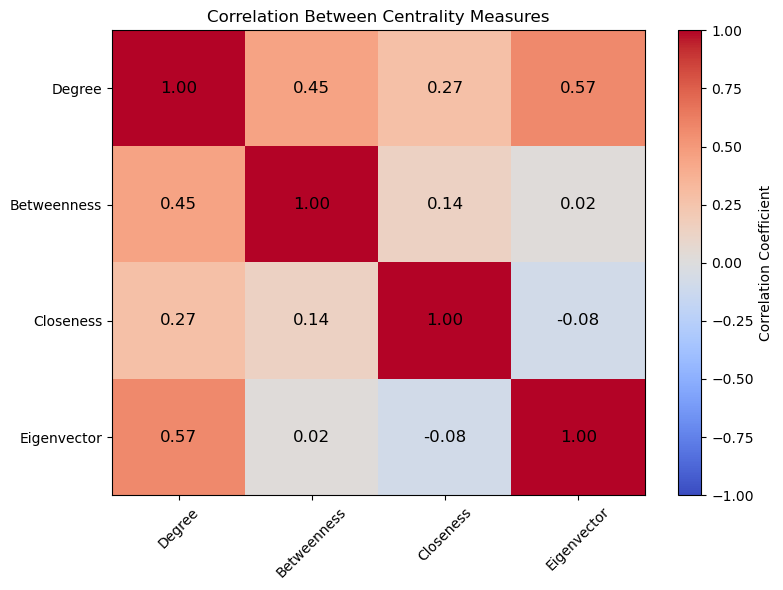

In [18]:
print("\n" + "="*80)
print("CORRELATION BETWEEN CENTRALITY MEASURES")
print("="*80)

correlation_matrix = centrality_df[['Degree', 'Betweenness', 'Closeness', 'Eigenvector']].corr()
print(correlation_matrix)

# Visualize correlation matrix
plt.figure(figsize=(8, 6))
plt.imshow(correlation_matrix, cmap='coolwarm', aspect='auto', vmin=-1, vmax=1)
plt.colorbar(label='Correlation Coefficient')
plt.xticks(range(4), correlation_matrix.columns, rotation=45)
plt.yticks(range(4), correlation_matrix.columns)
plt.title('Correlation Between Centrality Measures')

# Add correlation values to the plot
for i in range(4):
    for j in range(4):
        plt.text(j, i, f'{correlation_matrix.iloc[i, j]:.2f}',
                ha='center', va='center', color='black', fontsize=12)

plt.tight_layout()
plt.show()

## Conclusion

This analysis successfully identified central nodes in the Facebook ego network using multiple centrality measures and created an interactive visualization with appropriate visual encodings.

### Key Findings:

- The network shows typical social network properties with hub nodes and community structure
- Different centrality measures identify different types of important nodes
- High correlation between some measures suggests overlapping importance definitions
- The visualization reveals community structure and central nodes at a glance

## References

- Dataset: [SNAP Facebook Combined](https://snap.stanford.edu/data/ego-Facebook.html)
- NetworkX Documentation: https://networkx.org/
- Plotly Documentation: https://plotly.com/python/